# Concours MTH3302

## Calepin de base (succinct)

In [138]:
using CSV
using GLM
using MLJ
using DataFrames
using Gadfly
using Random
using Statistics
using Combinatorics
using LinearAlgebra

In [139]:
Random.seed!(4355)

TaskLocalRNG()

Chargement des données d'entrainement et à prédire.

In [140]:
train_data = CSV.read("train.csv", DataFrame, decimal=',')

first(train_data, 5)

Row,annee,type,nombre_cylindres,cylindree,transmission,boite,consommation
,Int64,String31,Int64,Float64,String15,String15,Float64
1,2023,voiture_moyenne,8,4.4,integrale,automatique,13.8359
2,2020,VUS_petit,4,2.0,integrale,automatique,9.80042
3,2021,voiture_compacte,6,3.3,propulsion,automatique,11.7605
4,2023,voiture_deux_places,8,5.0,integrale,automatique,13.0672
5,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359


## Fonctions utilitaires

In [141]:
# Afficher des diagrammes en boîte de consommation pour les variables du jeu de données
function box_plot_categorical(data)
    Gadfly.set_default_plot_size(30cm, 35cm)
    p1 = plot(data, x=:annee, y=:consommation, Geom.boxplot, Guide.title("Consommation par Année"), Guide.xlabel("Année"), Guide.ylabel("Consommation"))
    p2 = plot(data, x=:type, y=:consommation, Geom.boxplot, Guide.title("Consommation par Type de voiture"), Guide.xlabel("Type de voiture"), Guide.ylabel("Consommation"))
    p3 = plot(data, x=:nombre_cylindres, y=:consommation, Geom.boxplot, Guide.title("Consommation par nombre de cylindre"), Guide.xlabel("Nombre de cylindre"), Guide.ylabel("Consommation"))
    p4 = plot(data, x=:transmission, y=:consommation, Geom.boxplot, Guide.title("Consommation par type de transmission"), Guide.xlabel("Type de transmission"), Guide.ylabel("Consommation"))
    p5 = plot(data, x=:cylindree, y=:consommation, Geom.point, Geom.smooth(method=:lm), Guide.title("Nuage de points avec la droite de régression"), Guide.xlabel("Cylindree"), Guide.ylabel("Consommation"))
    p6 = plot(data, x=:boite, y=:consommation, Geom.boxplot, Guide.title("Consommation par type de boite de vitesse"), Guide.xlabel("Boite de vitesse"), Guide.ylabel("Consommation"))

    grid = vstack(hstack(p1, p2), hstack(p3, p4), hstack(p5, p6))
    display(grid)

    # réinitialiser la taille pour ne pas affecter les autres graphiques
    Gadfly.set_default_plot_size(20cm, 15cm)
end

box_plot_categorical (generic function with 1 method)

In [142]:
function remove_outliers_STUD(data)
    model = lm(@formula(y ~ x), data) # to get encoding

    X = modelmatrix(model)[:,2]
    H = X * inv(X' * X) * X'
    leverage = diag(H)

    predictions =  StatsModels.predict(model)
    residuals = y .- predictions

    student_residuals = residuals ./ sqrt.(1 .- leverage)
    treshold = 3
    outliers = abs.(student_residuals) .> treshold
    data = data[.!outliers, :]

    return data
end

function remove_outliers_STUD(data, features::Vector{Symbol}, target::Symbol=:y)
    formula = Term(target) ~ sum(Term(Symbol(feature)) for feature in features)

    model = lm(formula, data) # to get encoding

    X = modelmatrix(model)[:,2]
    H = X * inv(X' * X) * X'
    leverage = diag(H)

    y = data[:, target]
    predictions =  StatsModels.predict(model)
    residuals = y .- predictions

    student_residuals = residuals ./ sqrt.(1 .- leverage)
    treshold = 2.0
    outliers = abs.(student_residuals) .> treshold
    data = data[.!outliers, :]

    return data
end


remove_outliers_STUD (generic function with 3 methods)

In [143]:
# Supprimer les valeurs aberrantes avec la méthode de l'écart interquartile
function categorical_remove_outliers_IRQ(data, column, α=1.5)
    unique_values = unique(data[:, column])
    for value in unique_values
        subset = data[data[:, column] .== value, :]
        if size(subset, 1) == 0
            continue
        end
        q1 = quantile(subset[:, :consommation], 0.25)
        q3 = quantile(subset[:, :consommation], 0.75)
        iqr = q3 - q1
        lower_bound = q1 - α * iqr
        upper_bound = q3 + α * iqr
        data = data[(data[:, column] .!= value) .| ((data[:, column] .== value) .& (data[:, :consommation] .>= lower_bound) .& (data[:, :consommation] .<= upper_bound)), :]
    end
    return data
end

function categorical_replace_outliers_with_median(data, column, α=1.5)
    unique_values = unique(data[:, column])
    for value in unique_values
        subset = data[data[:, column] .== value, :]
        if size(subset, 1) == 0
            continue
        end
        q1 = quantile(subset[:, :consommation], 0.25)
        q3 = quantile(subset[:, :consommation], 0.75)
        iqr = q3 - q1
        lower_bound = q1 - α * iqr
        upper_bound = q3 + α * iqr

        outliers = (subset[:, :consommation] .< lower_bound) .| (subset[:, :consommation] .> upper_bound)
        non_outliers = subset[.!outliers, :]
        median_value = mean(non_outliers[:, :consommation])

        subset[outliers, :consommation] .= median_value
        data[data[:, column] .== value, :] = subset
    end
    return data
end
# data = deepcopy(train_data)

# data = categorical_replace_outliers_with_median(data, :type);

categorical_replace_outliers_with_median (generic function with 2 methods)

In [144]:
# Encoder les variables catégorielles en variables numériques
function one_hot_encode(data, columns)
    for column in columns
        coerce!(data, column => Multiclass)
    end

    one_hot = machine(OneHotEncoder(), data)
    fit!(one_hot, verbosity=0)
    return MLJ.transform(one_hot, data)
end

one_hot_encode (generic function with 1 method)

In [145]:
# Creation du modèle de régression linéaire avec la librairie MLJ
LinearRegressor = @load LinearRegressor pkg=MLJLinearModels
function create_linear_machine(X, y)
    linear_machine = machine(LinearRegressor(), X, y)
    fit!(linear_machine)
    return linear_machine
end

import MLJLinearModels ✔


[ Info: For silent loading, specify `verbosity=0`. 


create_linear_machine (generic function with 1 method)

In [146]:
# Creation du modèle de régression ridge avec la librairie MLJ
RidgeRegressor = @load RidgeRegressor pkg=MLJLinearModels verbosity=0
function ridge_reg(X, y, λ=1.0)
    ridge_machine = machine(RidgeRegressor(lambda=λ), X, y)
    fit!(ridge_machine, verbosity=0)
    return ridge_machine
end

ridge_reg (generic function with 2 methods)

## Exploration des données

In [108]:
MLJ.schema(train_data)

┌──────────────────┬────────────┬──────────┐
│ names            │ scitypes   │ types    │
├──────────────────┼────────────┼──────────┤
│ annee            │ Count      │ Int64    │
│ type             │ Textual    │ String31 │
│ nombre_cylindres │ Count      │ Int64    │
│ cylindree        │ Continuous │ Float64  │
│ transmission     │ Textual    │ String15 │
│ boite            │ Textual    │ String15 │
│ consommation     │ Continuous │ Float64  │
└──────────────────┴────────────┴──────────┘


In [109]:
describe(train_data)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,annee,2019.19,2014,2019.0,2024,0,Int64
2,type,,VUS_petit,,voiture_sous_compacte,0,String31
3,nombre_cylindres,5.28535,3,4.0,12,0,Int64
4,cylindree,2.90303,1.2,2.5,6.8,0,Float64
5,transmission,,4x4,,traction,0,String15
6,boite,,automatique,,manuelle,0,String15
7,consommation,10.3568,4.52327,10.2265,16.8007,0,Float64


Le type String15 pour les variables **type**, **transmission** et **boite** nous indique qu'il s'agit de variables catégorielles.  
Il faudra donc les encoder en variables numériques.   
  
---

On affiche le nuage de point de la consommation pour les variables numérique.  

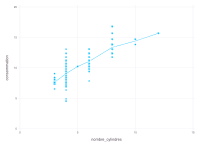

In [110]:
# analyser la consommation par nombre_cylindres
average_per_cylindres = combine(groupby(train_data, :nombre_cylindres), :consommation => mean)
plot(
    layer(train_data, x=:nombre_cylindres, y=:consommation, Geom.point),
    layer(average_per_cylindres, x=:nombre_cylindres, y=:consommation_mean, Geom.line),
    Guide.xlabel("nombre_cylindres"), Guide.ylabel("consommation")
)

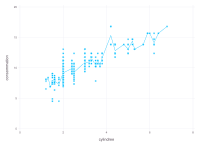

In [111]:
# analyser la consommation par cylindree
average_per_cylindree = combine(groupby(train_data, :cylindree), :consommation => mean)
plot(
    layer(train_data, x=:cylindree, y=:consommation, Geom.point),
    layer(average_per_cylindree, x=:cylindree, y=:consommation_mean, Geom.line),
    Guide.xlabel("cylindree"), Guide.ylabel("consommation")
)

## TODO moyenne --> regression

On affiche les boxplot de la consommation pour les variables catégorielles.

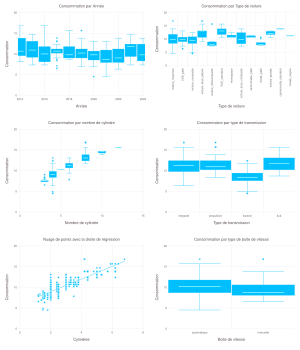

In [112]:
box_plot_categorical(train_data)

### TODO

## Prétraitement des données.

Comme vue précédemment, on va commencer par retirer les valeurs aberrantes de notre jeu de données.

In [113]:
# copy the data
filtered_train = deepcopy(train_data)

println("Before replace outliers: ", size(train_data, 1))

# filtered_train = remove_outliers(filtered_train, :annee);
# filtered_train = remove_outliers(filtered_train, :type);
# filtered_train = remove_outliers(filtered_train, :nombre_cylindres);
# filtered_train = remove_outliers(filtered_train, :transmission);
# filtered_train = remove_outliers(filtered_train, :boite);
# filtered_train = remove_outliers(filtered_train, :cylindree);

features = [:annee, :type, :nombre_cylindres, :cylindree, :transmission, :boite]
filtered_train = remove_outliers_STUD(filtered_train, features, :consommation)



println("After replace outliers: ", size(filtered_train, 1))

Before replace outliers: 396
After replace outliers: 382


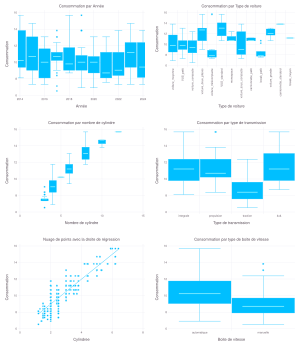

In [114]:
box_plot_categorical(filtered_train)

Après avoir retiré les valeurs aberrantes, on voit que les points en dehors des quartiles sont moins nombreux.

On remarque que certaines label des variables catégorielles sont très similaires.
Le diagramme en boite des types de transmission semble indiquer que "intégrale" et "4x4" sont similaire.  
Après vérification, il s'avère que "intégrale" et "4x4" correspondent pratiquement à la même chose ce qui justifie la similarité entre les diagrammes en boite.  
Nous allons donc fusionner ces deux catégories.

In [115]:
train_with_merge = deepcopy(filtered_train)

train_with_merge[train_with_merge[:, :transmission] .== "integrale", :transmission] .= "integrale_4x4"
train_with_merge[train_with_merge[:, :transmission] .== "4x4", :transmission] .= "integrale_4x4";

### TDOD

In [116]:
# train_with_merge[train_with_merge[:, :type] .== "voiture_sous_compacte", :type] .= "voiture_moyenne";
# train_with_merge[train_with_merge[:, :type] .== "voiture_compacte", :type] .= "VUS_petit"
# train_with_merge[train_with_merge[:, :annee] .== 2023, :annee] .= 2024;

On va maintenant encoder les variables catégorielles en variables numériques.  
Les variables catégorielles sont encodées en variables numériques en utilisant la méthode **OneHotEncoder**.
### TODO


In [117]:
categorical_cols = [:type, :transmission, :boite, :annee]

filtered_train = one_hot_encode(filtered_train, categorical_cols)
train_with_merge = one_hot_encode(train_with_merge, categorical_cols)

first(filtered_train, 5)

Row,annee__2014,annee__2015,annee__2016,annee__2017,annee__2018,annee__2019,annee__2020,annee__2021,annee__2022,annee__2023,annee__2024,type__VUS_petit,type__VUS_standard,type__break_moyen,type__break_petit,type__camionnette_petit,type__camionnette_standard,type__monospace,type__voiture_compacte,type__voiture_deux_places,type__voiture_grande,type__voiture_minicompacte,type__voiture_moyenne,type__voiture_sous_compacte,nombre_cylindres,cylindree,transmission__4x4,transmission__integrale,transmission__propulsion,transmission__traction,boite__automatique,boite__manuelle,consommation
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,8,4.4,0.0,1.0,0.0,0.0,1.0,0.0,13.8359
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,2.0,0.0,1.0,0.0,0.0,1.0,0.0,9.80042
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,6,3.3,0.0,0.0,1.0,0.0,1.0,0.0,11.7605
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,8,5.0,0.0,1.0,0.0,0.0,1.0,0.0,13.0672
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,8,4.4,0.0,1.0,0.0,0.0,1.0,0.0,13.8359


Nb de cylindre est une variable numérique INT64 qui suit une droite.  
On doit convertir en Float64 pour pouvoir l'utiliser dans le modèle comme variable continue.

In [118]:
filtered_train[!,:nombre_cylindres] = Float64.(filtered_train[:, :nombre_cylindres]);
train_with_merge[!,:nombre_cylindres] = Float64.(train_with_merge[:, :nombre_cylindres]);

## Regression linéaire 

### Regression sur les données d'entrainement non standardisées.

In [119]:
X₁ = select(filtered_train, Not(:consommation))
y₁ = filtered_train[:, :consommation]          

train₁, valid₁ = partition(eachindex(y₁), 0.8, shuffle=true) 
X_train₁, y_train₁ = X₁[train₁, :], y₁[train₁]
X_valid₁, y_valid₁ = X₁[valid₁, :], y₁[valid₁];

## TDOD

In [120]:
linear_model = create_linear_machine(X₁, y₁)

┌ Info: Training machine(LinearRegressor(fit_intercept = true, …), …).
└ @ MLJBase /home/julienr/.julia/packages/MLJBase/7nGJF/src/machines.jl:499
┌ Info: Solver: MLJLinearModels.Analytical
│   iterative: Bool false
│   max_inner: Int64 200
└ @ MLJLinearModels /home/julienr/.julia/packages/MLJLinearModels/yYgtO/src/mlj/interface.jl:27


trained Machine; caches model-specific representations of data
  model: LinearRegressor(fit_intercept = true, …)
  args: 
    1:	Source @665 ⏎ Table{AbstractVector{Continuous}}
    2:	Source @666 ⏎ AbstractVector{Continuous}


In [121]:
evaluate!(linear_model; resampling=CV(), measure=rmse)

PerformanceEvaluation object with these fields:
  model, measure, operation,
  measurement, per_fold, per_observation,
  fitted_params_per_fold, report_per_fold,
  train_test_rows, resampling, repeats
Extract:
┌────────────────────────┬───────────┬─────────────┐
│ measure                │ operation │ measurement │
├────────────────────────┼───────────┼─────────────┤
│ RootMeanSquaredError() │ predict   │ 0.785       │
└────────────────────────┴───────────┴─────────────┘
┌────────────────────────────────────────────┬─────────┐
│ per_fold                                   │ 1.96*SE │
├────────────────────────────────────────────┼─────────┤
│ [0.716, 0.822, 0.741, 0.831, 0.754, 0.838] │ 0.0463  │
└────────────────────────────────────────────┴─────────┘


Regression sur les données d'entrainement avec les elements fusionnés.

In [122]:
X₂ = select(train_with_merge, Not(:consommation))
y₂ = train_with_merge[:, :consommation]          

train₂, valid₂ = partition(eachindex(y₂), 0.8, shuffle=true) 
X_train₂, y_train₂ = X₂[train₂, :], y₂[train₂]
X_valid₂, y_valid₂ = X₂[valid₂, :], y₂[valid₂];

In [123]:
linear_model_merge = create_linear_machine(X₂, y₂)

┌ Info: Training machine(LinearRegressor(fit_intercept = true, …), …).
└ @ MLJBase /home/julienr/.julia/packages/MLJBase/7nGJF/src/machines.jl:499
┌ Info: Solver: MLJLinearModels.Analytical
│   iterative: Bool false
│   max_inner: Int64 200
└ @ MLJLinearModels /home/julienr/.julia/packages/MLJLinearModels/yYgtO/src/mlj/interface.jl:27


trained Machine; caches model-specific representations of data
  model: LinearRegressor(fit_intercept = true, …)
  args: 
    1:	Source @018 ⏎ Table{AbstractVector{Continuous}}
    2:	Source @544 ⏎ AbstractVector{Continuous}


In [124]:
evaluate!(linear_model_merge; resampling=CV(), measure=rmse)

PerformanceEvaluation object with these fields:
  model, measure, operation,
  measurement, per_fold, per_observation,
  fitted_params_per_fold, report_per_fold,
  train_test_rows, resampling, repeats
Extract:
┌────────────────────────┬───────────┬─────────────┐
│ measure                │ operation │ measurement │
├────────────────────────┼───────────┼─────────────┤
│ RootMeanSquaredError() │ predict   │ 0.787       │
└────────────────────────┴───────────┴─────────────┘
┌────────────────────────────────────────────┬─────────┐
│ per_fold                                   │ 1.96*SE │
├────────────────────────────────────────────┼─────────┤
│ [0.706, 0.836, 0.747, 0.813, 0.761, 0.847] │ 0.0489  │
└────────────────────────────────────────────┴─────────┘


## TEST  
https://juliaai.github.io/MLJ.jl/dev/preparing_data/


In [125]:
data = deepcopy(train_data);

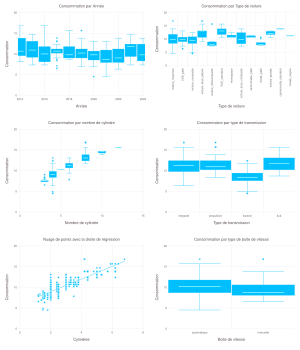

In [126]:
box_plot_categorical(data)


In [127]:
data = deepcopy(train_data);

# data[:, :annee_type] .= string.(data[:, :annee], "_", data[:, :type])
# data = select(data, Not([:annee, :type]))

first(data, 5)

Row,annee,type,nombre_cylindres,cylindree,transmission,boite,consommation
,Int64,String31,Int64,Float64,String15,String15,Float64
1,2023,voiture_moyenne,8,4.4,integrale,automatique,13.8359
2,2020,VUS_petit,4,2.0,integrale,automatique,9.80042
3,2021,voiture_compacte,6,3.3,propulsion,automatique,11.7605
4,2023,voiture_deux_places,8,5.0,integrale,automatique,13.0672
5,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359


In [128]:

println("Before replace outliers: ", size(data, 1))

# data = categorical_remove_outliers_IRQ(data, :annee);
# data = categorical_remove_outliers_IRQ(data, :type);
# # data = remove_outliers_IRQ(data, :nombre_cylindres);
# data = categorical_remove_outliers_IRQ(data, :transmission);
# data = categorical_remove_outliers_IRQ(data, :boite);
# # data = remove_outliers_IRQ(data, :cylindree);

data = categorical_replace_outliers_with_median(data, :annee);
data = categorical_replace_outliers_with_median(data, :type);

# data = categorical_replace_outliers_with_median(data, :annee_type);

# data = categorical_replace_outliers_with_median(data, :nombre_cylindres);
data = categorical_replace_outliers_with_median(data, :transmission);
data = categorical_replace_outliers_with_median(data, :boite);

features = [:nombre_cylindres, :cylindree]
data = remove_outliers_STUD(data, features, :consommation)

println("After replace outliers: ", size(data, 1))

# box_plot_categorical(data)

Before replace outliers: 396
After replace outliers: 367


In [129]:
# data[data[:, :transmission] .== "integrale", :transmission] .= "integrale_4x4"
# data[data[:, :transmission] .== "4x4", :transmission] .= "integrale_4x4";

In [130]:
X₀ = select(data, Not(:consommation))
y₀ = data[:, :consommation];

In [131]:
MLJ.schema(data)

┌──────────────────┬────────────┬──────────┐
│ names            │ scitypes   │ types    │
├──────────────────┼────────────┼──────────┤
│ annee            │ Count      │ Int64    │
│ type             │ Textual    │ String31 │
│ nombre_cylindres │ Count      │ Int64    │
│ cylindree        │ Continuous │ Float64  │
│ transmission     │ Textual    │ String15 │
│ boite            │ Textual    │ String15 │
│ consommation     │ Continuous │ Float64  │
└──────────────────┴────────────┴──────────┘


In [132]:
X₀_coerced = coerce(X₀, :annee=>Multiclass, :type=>Multiclass, :nombre_cylindres=>Continuous, :transmission=>Multiclass, :boite=>Multiclass, :annee_type=>Multiclass)
MLJ.schema(X₀_coerced)

┌──────────────────┬────────────────┬────────────────────────────────────┐
│ names            │ scitypes       │ types                              │
├──────────────────┼────────────────┼────────────────────────────────────┤
│ annee            │ Multiclass{11} │ CategoricalValue{Int64, UInt32}    │
│ type             │ Multiclass{13} │ CategoricalValue{String31, UInt32} │
│ nombre_cylindres │ Continuous     │ Float64                            │
│ cylindree        │ Continuous     │ Float64                            │
│ transmission     │ Multiclass{4}  │ CategoricalValue{String15, UInt32} │
│ boite            │ Multiclass{2}  │ CategoricalValue{String15, UInt32} │
└──────────────────┴────────────────┴────────────────────────────────────┘


In [133]:
# using MLJModels
# ContinuousEncoder = @load ContinuousEncoder pkg=MLJModels verbosity=0
# encoder = ContinuousEncoder()
# mach = machine(encoder, X₀_coerced) |> fit!

categorical_cols = [:transmission, :boite, :annee_type]

X₀_trans = one_hot_encode(X₀_coerced, categorical_cols)

first(X₀_trans, 5)

Row,annee__2014,annee__2015,annee__2016,annee__2017,annee__2018,annee__2019,annee__2020,annee__2021,annee__2022,annee__2023,annee__2024,type__VUS_petit,type__VUS_standard,type__break_moyen,type__break_petit,type__camionnette_petit,type__camionnette_standard,type__monospace,type__voiture_compacte,type__voiture_deux_places,type__voiture_grande,type__voiture_minicompacte,type__voiture_moyenne,type__voiture_sous_compacte,nombre_cylindres,cylindree,transmission__4x4,transmission__integrale,transmission__propulsion,transmission__traction,boite__automatique,boite__manuelle
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,8.0,4.4,0.0,1.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,6.0,3.3,0.0,0.0,1.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,8.0,5.0,0.0,1.0,0.0,0.0,1.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,8.0,4.4,0.0,1.0,0.0,0.0,1.0,0.0


In [134]:
test_linear = create_linear_machine(X₀_trans, y₀)

┌ Info: Training machine(LinearRegressor(fit_intercept = true, …), …).
└ @ MLJBase /home/julienr/.julia/packages/MLJBase/7nGJF/src/machines.jl:499
┌ Info: Solver: MLJLinearModels.Analytical
│   iterative: Bool false
│   max_inner: Int64 200
└ @ MLJLinearModels /home/julienr/.julia/packages/MLJLinearModels/yYgtO/src/mlj/interface.jl:27


trained Machine; caches model-specific representations of data
  model: LinearRegressor(fit_intercept = true, …)
  args: 
    1:	Source @818 ⏎ Table{AbstractVector{Continuous}}
    2:	Source @984 ⏎ AbstractVector{Continuous}


In [135]:
evaluate!(test_linear; resampling=CV(), measure=rmse)

PerformanceEvaluation object with these fields:
  model, measure, operation,
  measurement, per_fold, per_observation,
  fitted_params_per_fold, report_per_fold,
  train_test_rows, resampling, repeats
Extract:
┌────────────────────────┬───────────┬─────────────┐
│ measure                │ operation │ measurement │
├────────────────────────┼───────────┼─────────────┤
│ RootMeanSquaredError() │ predict   │ 0.756       │
└────────────────────────┴───────────┴─────────────┘
┌────────────────────────────────────────────┬─────────┐
│ per_fold                                   │ 1.96*SE │
├────────────────────────────────────────────┼─────────┤
│ [0.703, 0.853, 0.662, 0.787, 0.722, 0.795] │ 0.0615  │
└────────────────────────────────────────────┴─────────┘


outlier removed 0.787  
better outlier removed 0.756  
voiture_type et année merge 0.764  

In [136]:
X_test = CSV.read("test.csv", DataFrame, decimal=',')

X_test[!,:nombre_cylindres] = Float64.(X_test[:, :nombre_cylindres]);

first(X_test, 5)

# X_test[:, :annee_type] .= string.(X_test[:, :annee], "_", X_test[:, :type])
# X_test = select(X_test, Not([:annee, :type]))
X_test = coerce(X_test, :annee=>Multiclass, :type=>Multiclass, :nombre_cylindres=>Continuous, :transmission=>Multiclass, :boite=>Multiclass, :annee_type=>Multiclass)
X_test = one_hot_encode(X_test, categorical_cols)

first(X_test, 5)

Row,annee__2014,annee__2015,annee__2016,annee__2017,annee__2018,annee__2019,annee__2020,annee__2021,annee__2022,annee__2023,annee__2024,type__VUS_petit,type__VUS_standard,type__break_moyen,type__break_petit,type__camionnette_petit,type__camionnette_standard,type__monospace,type__voiture_compacte,type__voiture_deux_places,type__voiture_grande,type__voiture_minicompacte,type__voiture_moyenne,type__voiture_sous_compacte,nombre_cylindres,cylindree,transmission__4x4,transmission__integrale,transmission__propulsion,transmission__traction,boite__automatique,boite__manuelle
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,2.5,0.0,0.0,0.0,1.0,0.0,1.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,2.5,0.0,0.0,0.0,1.0,1.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.5,0.0,0.0,0.0,1.0,1.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0
5,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,5.8,0.0,0.0,1.0,0.0,0.0,1.0


In [137]:
y_pred = collect(MLJ.predict(test_linear, X_test));

n = length(y_pred)
id = 1:n

df_pred = DataFrame(id=id, consommation=y_pred)
CSV.write("benchmark.csv", df_pred)

best_pred = CSV.read("current_best.csv", DataFrame, decimal='.')
current_pred = CSV.read("benchmark.csv", DataFrame, decimal='.')
println("rmse between best and current: ", rms(best_pred.consommation, current_pred.consommation))

rmse between best and current: 0.31017193928689296


# Création du fichier de prédictions

In [138]:
X_test = CSV.read("test.csv", DataFrame, decimal=',')

X_test[!,:nombre_cylindres] = Float64.(X_test[:, :nombre_cylindres]);

first(X_test, 5)

Row,annee,type,nombre_cylindres,cylindree,transmission,boite
,Int64,String31,Float64,Float64,String15,String15
1,2014,voiture_moyenne,4.0,2.5,traction,manuelle
2,2014,voiture_moyenne,4.0,2.5,traction,automatique
3,2014,VUS_petit,4.0,2.5,traction,automatique
4,2014,VUS_petit,4.0,2.0,4x4,automatique
5,2014,voiture_sous_compacte,8.0,5.8,propulsion,manuelle


In [139]:
X_test_with_merge = deepcopy(X_test)

X_test_with_merge[X_test_with_merge[:, :transmission] .== "integrale", :transmission] .= "integrale_4x4";
X_test_with_merge[X_test_with_merge[:, :transmission] .== "4x4", :transmission] .= "integrale_4x4";
# test[test[:, :type] .== "voiture_sous_compacte", :type] .= "voiture_moyenne";
# test[test[:, :type] .== "voiture_compacte", :type] .= "VUS_petit"
# test[test[:, :annee] .== 2023, :annee] .= 2024;

17-element view(::PooledArrays.PooledVector{String15, UInt32, Vector{UInt32}}, [4, 8, 19, 20, 26, 27, 28, 35, 84, 85, 101, 102, 118, 119, 124, 125, 134]) with eltype String15:
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"

In [140]:
categorical_cols = [:transmission, :boite, :annee, :type]

X_test = one_hot_encode(X_test, categorical_cols);
X_test_with_merge = one_hot_encode(X_test_with_merge, categorical_cols);

In [141]:
y_pred = collect(MLJ.predict(linear_model_merge, X_test_with_merge));

In [142]:
n = length(y_pred)
id = 1:n

df_pred = DataFrame(id=id, consommation=y_pred)
CSV.write("benchmark.csv", df_pred)

"benchmark.csv"

In [143]:
best_pred = CSV.read("current_best.csv", DataFrame, decimal='.')

current_pred = CSV.read("benchmark.csv", DataFrame, decimal='.')

println("rmse between best and current: ", rms(best_pred.consommation, current_pred.consommation))

rmse between best and current: 0.2938382782105678


In [144]:
y_pred = collect(MLJ.predict(linear_model, X_test));
n = length(y_pred)
id = 1:n

df_pred = DataFrame(id=id, consommation=y_pred)
CSV.write("benchmark.csv", df_pred)
best_pred = CSV.read("current_best.csv", DataFrame, decimal='.')

current_pred = CSV.read("benchmark.csv", DataFrame, decimal='.')

println("rmse between best and current: ", rms(best_pred.consommation, current_pred.consommation))

rmse between best and current: 0.2857206923895917


## Consommation exploration 

In [147]:
length(unique(train_data[:, :consommation]))

25

In [ ]:
data = deepcopy(train_data);

data = categorical_replace_outliers_with_median(data, :annee);
data = categorical_replace_outliers_with_median(data, :type);

# data = categorical_replace_outliers_with_median(data, :annee_type);

# data = categorical_replace_outliers_with_median(data, :nombre_cylindres);
data = categorical_replace_outliers_with_median(data, :transmission);
data = categorical_replace_outliers_with_median(data, :boite);

features = [:nombre_cylindres, :cylindree]
data = remove_outliers_STUD(data, features, :consommation);

Row,annee,type,nombre_cylindres,cylindree,transmission,boite,consommation
,Int64,String31,Int64,Float64,String15,String15,Float64
1,2023,voiture_moyenne,8,4.4,integrale,automatique,13.8359
2,2020,VUS_petit,4,2.0,integrale,automatique,9.80042
3,2021,voiture_compacte,6,3.3,propulsion,automatique,11.7605
4,2023,voiture_deux_places,8,5.0,integrale,automatique,13.0672
5,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359
6,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359
7,2022,voiture_minicompacte,3,1.5,traction,automatique,7.35031
8,2024,voiture_minicompacte,3,1.5,traction,manuelle,7.58742
9,2020,VUS_standard,6,3.8,integrale,automatique,11.2005


In [149]:
unique_conso = unique(data[:, :consommation])
for conso in unique_conso
    println("Conso: ", conso)
    println(data[data[:, :consommation] .== conso, :])
end

Conso: 13.8358823529412
18×7 DataFrame
 Row │ annee  type                   nombre_cylindres  cylindree  transmission  boite        consommation 
     │ Int64  String31               Int64             Float64    String15      String15     Float64      
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  2023  voiture_moyenne                       8        4.4  integrale     automatique       13.8359
   2 │  2022  voiture_moyenne                       8        4.4  integrale     automatique       13.8359
   3 │  2022  voiture_moyenne                       8        4.4  integrale     automatique       13.8359
   4 │  2014  voiture_deux_places                   8        4.2  integrale     automatique       13.8359
   5 │  2014  VUS_standard                          8        4.8  integrale     automatique       13.8359
   6 │  2023  voiture_sous_compacte                 8        4.4  integrale     automatique       13.8359
   7


Conso: 9.04653846153846
22×7 DataFrame
 Row │ annee  type                   nombre_cylindres  cylindree  transmission  boite        consommation 
     │ Int64  String31               Int64             Float64    String15      String15     Float64      
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  2020  voiture_deux_places                   4        2.0  propulsion    automatique       9.04654
   2 │  2022  voiture_moyenne                       4        2.0  integrale     automatique       9.04654
   3 │  2022  VUS_petit                             4        2.5  4x4           automatique       9.04654
   4 │  2021  voiture_minicompacte                  4        2.0  traction      manuelle          9.04654
   5 │  2019  VUS_petit                             4        2.0  integrale     automatique       9.04654
   6 │  2022  VUS_petit                             4        2.4  traction      automatique       9.04654
   

In [ ]:
unique_conso = unique(data[:, :consommation])
for conso in unique_conso
    println("Conso: ", conso)
    println(data[data[:, :consommation] .== conso, :])
end

Conso: 13.8358823529412
18×7 DataFrame
 Row │ annee  type                   nombre_cylindres  cylindree  transmission  boite        consommation 
     │ Int64  String31               Int64             Float64    String15      String15     Float64      
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  2023  voiture_moyenne                       8        4.4  integrale     automatique       13.8359
   2 │  2022  voiture_moyenne                       8        4.4  integrale     automatique       13.8359
   3 │  2022  voiture_moyenne                       8        4.4  integrale     automatique       13.8359
   4 │  2014  voiture_deux_places                   8        4.2  integrale     automatique       13.8359
   5 │  2014  VUS_standard                          8        4.8  integrale     automatique       13.8359
   6 │  2023  voiture_sous_compacte                 8        4.4  integrale     automatique       13.8359
   7


Conso: 9.04653846153846
22×7 DataFrame
 Row │ annee  type                   nombre_cylindres  cylindree  transmission  boite        consommation 
     │ Int64  String31               Int64             Float64    String15      String15     Float64      
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  2020  voiture_deux_places                   4        2.0  propulsion    automatique       9.04654
   2 │  2022  voiture_moyenne                       4        2.0  integrale     automatique       9.04654
   3 │  2022  VUS_petit                             4        2.5  4x4           automatique       9.04654
   4 │  2021  voiture_minicompacte                  4        2.0  traction      manuelle          9.04654
   5 │  2019  VUS_petit                             4        2.0  integrale     automatique       9.04654
   6 │  2022  VUS_petit                             4        2.4  traction      automatique       9.04654
   

In [150]:

# sort(train_data[(train_data[:, :type] .== "voiture_deux_places") ,:], :consommation)

In [151]:
voiture_deux_place_6_cylindre = data[(data[:, :type] .== "voiture_deux_places") .& (data[:, :nombre_cylindres] .== 6), :]
sort(voiture_deux_place_6_cylindre, :consommation)

Row,annee,type,nombre_cylindres,cylindree,transmission,boite,consommation
,Int64,String31,Int64,Float64,String15,String15,Float64
1,2020,voiture_deux_places,6,3.0,propulsion,automatique,10.2265
2,2017,voiture_deux_places,6,3.0,propulsion,automatique,10.2265
3,2015,voiture_deux_places,6,3.0,propulsion,automatique,10.2265
4,2020,voiture_deux_places,6,3.0,propulsion,automatique,10.2265
5,2021,voiture_deux_places,6,3.0,propulsion,automatique,10.6914
6,2020,voiture_deux_places,6,3.0,propulsion,automatique,10.6914
7,2021,voiture_deux_places,6,3.0,propulsion,automatique,10.6914
8,2020,voiture_deux_places,6,3.0,propulsion,automatique,10.6914
9,2017,voiture_deux_places,6,3.0,propulsion,automatique,10.6914


In [152]:
grouped_data = groupby(data, [:type, :nombre_cylindres, :cylindree, :transmission, :boite])
mean_data = combine(grouped_data, :consommation => mean => :mean_consommation)

train_data_with_mean = innerjoin(data, mean_data, on=[:type, :nombre_cylindres, :cylindree, :transmission, :boite])
first(sort(train_data_with_mean[:, :mean_consommation]), 5)

mean_dict = Dict{Tuple, Float64}()
for row in eachrow(mean_data)
    key = (row[:type], row[:nombre_cylindres], row[:cylindree], row[:transmission], row[:boite])
    mean_dict[key] = row[:mean_consommation]
end

mean_dict

Dict{Tuple, Float64} with 134 entries:
  (String31("VUS_petit"), 6, 3.2, String15("integrale"), String15("a… => 10.6914
  (String31("break_petit"), 3, 1.2, String15("traction"), String15("… => 7.84033
  (String31("voiture_compacte"), 6, 3.5, String15("traction"), Strin… => 10.2265
  (String31("voiture_compacte"), 6, 3.3, String15("integrale"), Stri… => 11.7605
  (String31("VUS_standard"), 8, 6.4, String15("4x4"), String15("auto… => 15.6807
  (String31("camionnette_petit"), 6, 3.5, String15("traction"), Stri… => 10.6914
  (String31("VUS_petit"), 4, 2.4, String15("4x4"), String15("manuell… => 9.4084
  (String31("voiture_grande"), 6, 3.3, String15("propulsion"), Strin… => 11.7605
  (String31("VUS_standard"), 8, 5.3, String15("propulsion"), String1… => 13.0672
  (String31("VUS_petit"), 4, 2.0, String15("traction"), String15("au… => 9.30079
  (String31("VUS_petit"), 4, 1.8, String15("integrale"), String15("a… => 8.11069
  (String31("voiture_grande"), 6, 3.8, String15("propulsion"), Strin… =

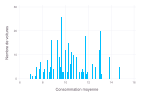

In [162]:
plot(
    layer(train_data_with_mean, x=:mean_consommation, Geom.histogram),
    Guide.xlabel("Consommation moyenne"), Guide.ylabel("Nombre de voitures")
)

In [153]:
test_data = CSV.read("test.csv", DataFrame, decimal=',');

In [154]:
function add_mean_consumption_with_fallback(data, mean_dict)
    mean_consumption = Float64[]
    
    for row in eachrow(data)
        key = (row[:type], row[:nombre_cylindres], row[:cylindree], row[:transmission], row[:boite])
        
        if haskey(mean_dict, key)
            # Exact match found
            push!(mean_consumption, mean_dict[key])
        else
            # Fallback to the most similar match
            candidates = collect(filter(k -> k[1] == row[:type], keys(mean_dict)))  # Match `:type`
            
            if !isempty(candidates)
                # Sort candidates by similarity (or proximity) for numeric fields
                sorted_candidates = sort(candidates, by = c -> (
                    abs(c[2] - row[:nombre_cylindres]),  # Difference in `:nombre_cylindres`
                    abs(c[3] - row[:cylindree])          # Difference in `:cylindree`
                ))
                
                best_match = first(sorted_candidates)
                println("For key: ", key, " best match: ", best_match)

                push!(mean_consumption, mean_dict[best_match])
            else
                # No match found even for `:type`
                push!(mean_consumption, NaN)
            end
        end
    end
    
    data[!, :mean_consommation] = mean_consumption
    return data
end

# Apply the updated function to `test_data`
test_data = add_mean_consumption_with_fallback(test_data, mean_dict)
first(test_data, 5)


For key: (String31("voiture_sous_compacte"), 8, 5.8, String15("propulsion"), String15("manuelle")) best match: (String31("voiture_sous_compacte"), 8, 5.0, String15("propulsion"), String15("manuelle"))
For key: (String31("voiture_deux_places"), 10, 5.2, String15("integrale"), String15("manuelle")) best match: (String31("voiture_deux_places"), 10, 5.2, String15("integrale"), String15("automatique"))
For key: (String31("voiture_deux_places"), 10, 5.2, String15("integrale"), String15("manuelle")) best match: (String31("voiture_deux_places"), 10, 5.2, String15("integrale"), String15("automatique"))
For key: (String31("voiture_sous_compacte"), 12, 5.9, String15("propulsion"), String15("automatique")) best match: (String31("voiture_sous_compacte"), 8, 5.0, String15("propulsion"), String15("manuelle"))
For key: (String31("camionnette_standard"), 8, 5.3, String15("propulsion"), String15("automatique")) best match: (String31("camionnette_standard"), 8, 5.7, String15("propulsion"), String15("auto

Row,annee,type,nombre_cylindres,cylindree,transmission,boite,mean_consommation
,Int64,String31,Int64,Float64,String15,String15,Float64
1,2014,voiture_moyenne,4,2.5,traction,manuelle,8.11069
2,2014,voiture_moyenne,4,2.5,traction,automatique,7.84033
3,2014,VUS_petit,4,2.5,traction,automatique,8.66848
4,2014,VUS_petit,4,2.0,4x4,automatique,8.71148
5,2014,voiture_sous_compacte,8,5.8,propulsion,manuelle,13.8359


In [155]:
test_data[ismissing(test_data[!, :mean_consommation]) .| isnan.(test_data[!, :mean_consommation]), :]

Row,annee,type,nombre_cylindres,cylindree,transmission,boite,mean_consommation
,Int64,String31,Int64,Float64,String15,String15,Float64


In [156]:
MLJ.schema(train_data_with_mean)
train_data_with_mean = select(train_data_with_mean, Not(:annee))

Row,type,nombre_cylindres,cylindree,transmission,boite,consommation,mean_consommation
,String31,Int64,Float64,String15,String15,Float64,Float64
1,voiture_moyenne,8,4.4,integrale,automatique,13.8359,13.0036
2,VUS_petit,4,2.0,integrale,automatique,9.80042,9.62635
3,voiture_compacte,6,3.3,propulsion,automatique,11.7605,11.4805
4,voiture_deux_places,8,5.0,integrale,automatique,13.0672,13.0672
5,voiture_moyenne,8,4.4,integrale,automatique,13.8359,13.0036
6,voiture_moyenne,8,4.4,integrale,automatique,13.8359,13.0036
7,voiture_minicompacte,3,1.5,traction,automatique,7.35031,7.49574
8,voiture_minicompacte,3,1.5,traction,manuelle,7.58742,7.58742
9,VUS_standard,6,3.8,integrale,automatique,11.2005,11.2005


In [157]:
coerce!(train_data_with_mean, :type => Multiclass, :transmission => Multiclass, :boite => Multiclass, :mean_consommation=>Continuous, :annee=>Multiclass);

In [158]:
train_data_with_mean[!, :nombre_cylindres] = Float64.(train_data_with_mean[!, :nombre_cylindres]);
train_data_with_mean = one_hot_encode(train_data_with_mean, [:type, :transmission, :boite]);

In [159]:
X = select(train_data_with_mean, Not(:consommation))
y = train_data_with_mean[:, :consommation]

linear_mean = create_linear_machine(X, y)

evaluate!(linear_mean; resampling=CV(), measure=rmse)

[ Info: Training machine(LinearRegressor(fit_intercept = true, …), …).
┌ Info: Solver: MLJLinearModels.Analytical
│   iterative: Bool false
└   max_inner: Int64 200


PerformanceEvaluation object with these fields:
  model, measure, operation,
  measurement, per_fold, per_observation,
  fitted_params_per_fold, report_per_fold,
  train_test_rows, resampling, repeats
Extract:
┌────────────────────────┬───────────┬─────────────┐
│ measure                │ operation │ measurement │
├────────────────────────┼───────────┼─────────────┤
│ RootMeanSquaredError() │ predict   │ 0.492       │
└────────────────────────┴───────────┴─────────────┘
┌──────────────────────────────────────────┬─────────┐
│ per_fold                                 │ 1.96*SE │
├──────────────────────────────────────────┼─────────┤
│ [0.488, 0.55, 0.419, 0.566, 0.42, 0.489] │ 0.0544  │
└──────────────────────────────────────────┴─────────┘


In [160]:
test_data = select(test_data, Not(:annee))

coerce!(test_data, :type => Multiclass, :transmission => Multiclass, :boite => Multiclass, :mean_consommation=>Continuous, :annee=>Multiclass);

test_data[!, :nombre_cylindres] = Float64.(test_data[!, :nombre_cylindres]);

test_data = one_hot_encode(test_data, [:type, :transmission, :boite]);

y_pred = collect(MLJ.predict(linear_mean, test_data));

n = length(y_pred)
id = 1:n

df_pred = DataFrame(id=id, consommation=y_pred)
CSV.write("benchmark.csv", df_pred)


"benchmark.csv"

In [161]:
best_pred = CSV.read("current_best.csv", DataFrame, decimal='.')
current_pred = CSV.read("benchmark.csv", DataFrame, decimal='.')
println("rmse between best and current: ", rms(best_pred.consommation, current_pred.consommation))

rmse between best and current: 0.6390138680775451


---

In [220]:
# Copy the training data to avoid modifying the original
data = deepcopy(train_data)

# Get unique consumption values
unique_consumption = unique(data[:, :consommation])

# Initialize a DataFrame to hold grouped car properties
car_groups = DataFrame(
    start_year=Float64[],
    end_year=Float64[],
    type=Vector{String}[],
    nombre_cylindres=Vector{Int64}[],
    cylindree_start=Float64[],
    cylindree_end=Float64[],
    transmission=Vector{String}[],
    boite=Vector{String}[]
)

# Iterate over unique consumption values to group data
for consumption in unique_consumption
    # Filter rows with the current consumption value
    subset = data[data[:, :consommation] .== consumption, :]

    # Gather group properties
    start_year = minimum(subset[:, :annee])
    end_year = maximum(subset[:, :annee])
    types = unique(subset[:, :type])
    cylinders = unique(subset[:, :nombre_cylindres])
    cylindree_start = minimum(subset[:, :cylindree])
    cylindree_end = maximum(subset[:, :cylindree])
    transmissions = unique(subset[:, :transmission])
    boxes = unique(subset[:, :boite])

    # Add the group properties to the car_groups DataFrame
    push!(car_groups, (
        start_year, 
        end_year, 
        types, 
        cylinders, 
        cylindree_start, 
        cylindree_end, 
        transmissions, 
        boxes
    ))
end

println("Number of groups: ", size(car_groups, 1))
# println(first(car_groups, 5))

# Initialize the car_group column in data with -1 (unmatched)
data[:, :car_group] .= -1

# Match each row in data to a group
for (index, row) in enumerate(eachrow(data))
    # Find the first matching group
    for (group_index, group) in enumerate(eachrow(car_groups))
        if row[:annee] >= group.start_year &&
           row[:annee] <= group.end_year &&
           (row[:type] in group.type) &&
           (row[:nombre_cylindres] in group.nombre_cylindres) &&
           row[:cylindree] >= group.cylindree_start &&
           row[:cylindree] <= group.cylindree_end &&
           (row[:transmission] in group.transmission) &&
           (row[:boite] in group.boite)
           
            # Assign the group index to the current row
            data[index, :car_group] = group_index
            break  # Stop checking once a match is found
        end
    end
end

# Validate if every row has a valid group
if any(data[:, :car_group] .== -1)
    println("Warning: Some rows did not match any group.")
    unmatched_rows = data[data[:, :car_group] .== -1, :]
    println("Unmatched rows: ", unmatched_rows)
else
    println("All rows successfully matched to a group.")
end

data;


Number of groups: 25
All rows successfully matched to a group.


In [221]:
MLJ.schema(data)

┌──────────────────┬────────────┬──────────┐
│ names            │ scitypes   │ types    │
├──────────────────┼────────────┼──────────┤
│ annee            │ Count      │ Int64    │
│ type             │ Textual    │ String31 │
│ nombre_cylindres │ Count      │ Int64    │
│ cylindree        │ Continuous │ Float64  │
│ transmission     │ Textual    │ String15 │
│ boite            │ Textual    │ String15 │
│ consommation     │ Continuous │ Float64  │
│ car_group        │ Count      │ Int64    │
└──────────────────┴────────────┴──────────┘


In [222]:
coerce!(data, :type=>Multiclass, :transmission=>Multiclass, :boite=>Multiclass, :car_group=>Multiclass, :consommation=>Continuous)
MLJ.schema(data)

┌──────────────────┬────────────────┬────────────────────────────────────┐
│ names            │ scitypes       │ types                              │
├──────────────────┼────────────────┼────────────────────────────────────┤
│ annee            │ Count          │ Int64                              │
│ type             │ Multiclass{13} │ CategoricalValue{String31, UInt32} │
│ nombre_cylindres │ Count          │ Int64                              │
│ cylindree        │ Continuous     │ Float64                            │
│ transmission     │ Multiclass{4}  │ CategoricalValue{String15, UInt32} │
│ boite            │ Multiclass{2}  │ CategoricalValue{String15, UInt32} │
│ consommation     │ Continuous     │ Float64                            │
│ car_group        │ Multiclass{13} │ CategoricalValue{Int64, UInt32}    │
└──────────────────┴────────────────┴────────────────────────────────────┘


In [223]:
X = select(data, :car_group, :nombre_cylindres, :cylindree) 

y = data[:, :consommation]
X[!, :nombre_cylindres] = Float64.(X[!, :nombre_cylindres])

X = one_hot_encode(X, [:car_group])

Row,car_group__1,car_group__2,car_group__3,car_group__4,car_group__5,car_group__6,car_group__7,car_group__10,car_group__12,car_group__13,car_group__14,car_group__15,car_group__19,nombre_cylindres,cylindree
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,4.4
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,3.3
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,5.0
5,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,4.4
6,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,4.4
7,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.5
8,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.5
9,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,3.8


In [224]:

linear_car_group = create_linear_machine(X, y)

[ Info: Training machine(LinearRegressor(fit_intercept = true, …), …).
┌ Info: Solver: MLJLinearModels.Analytical
│   iterative: Bool false
└   max_inner: Int64 200


trained Machine; caches model-specific representations of data
  model: LinearRegressor(fit_intercept = true, …)
  args: 
    1:	Source @142 ⏎ Table{AbstractVector{Continuous}}
    2:	Source @329 ⏎ AbstractVector{Continuous}


In [225]:
evaluate!(linear_car_group; resampling=CV(), measure=rmse)

PerformanceEvaluation object with these fields:
  model, measure, operation,
  measurement, per_fold, per_observation,
  fitted_params_per_fold, report_per_fold,
  train_test_rows, resampling, repeats
Extract:
┌────────────────────────┬───────────┬─────────────┐
│ measure                │ operation │ measurement │
├────────────────────────┼───────────┼─────────────┤
│ RootMeanSquaredError() │ predict   │ 1.03        │
└────────────────────────┴───────────┴─────────────┘
┌────────────────────────────────────────┬─────────┐
│ per_fold                               │ 1.96*SE │
├────────────────────────────────────────┼─────────┤
│ [0.946, 1.03, 1.09, 1.06, 0.979, 1.07] │ 0.0495  │
└────────────────────────────────────────┴─────────┘
